# paper
# https://arxiv.org/abs/1409.4842v1

#  Inception V3

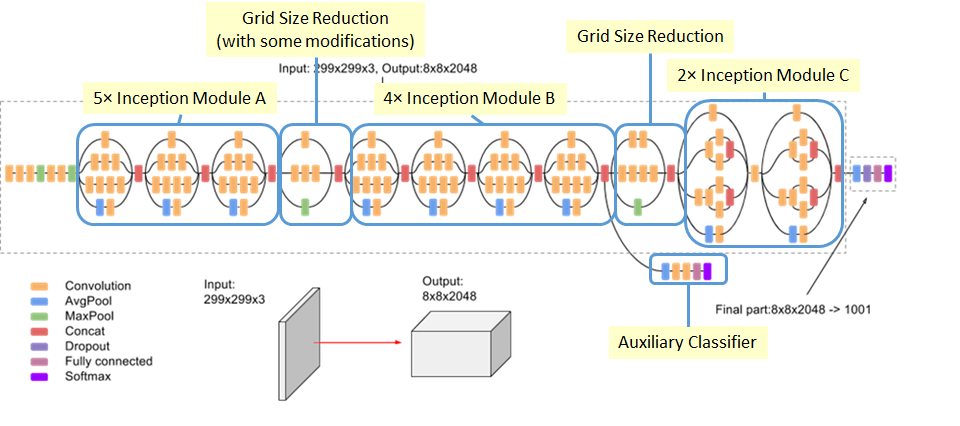

Inception-v3 is a convolutional neural network that is 48 layers deep. You can load a pretrained version of the network trained on more than a million images from the ImageNet database. The pretrained network can classify images into 1000 object categories, such as keyboard, mouse, pencil, and many animals. As a result, the network has learned rich feature representations for a wide range of images. The network has an image input size of 299-by-299.


# Inception V1

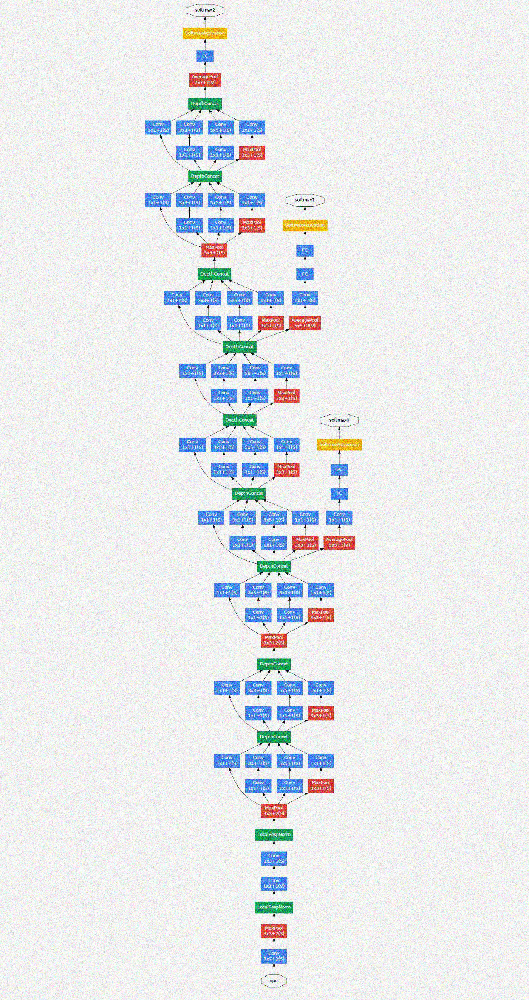


Inception V1 Model Description:¶
In a traditional neural network layer or convolutional neural network layer, the output from the previous layer is the input for the next layer and follows that pattern until the prediction. The basic idea of the inception network is the inception block. It takes apart the individual layers and instead of passing it through 1 layer it takes the previous layer input and passes it to four different operations in parallel and then concatenates the outlets from all these different layers. Below is the figure of the inception block. Don’t worry about the picture you saw below, we will get into the details of it.

Let’s understand what is inception block and how it works. Google Net is made of 9 inception blocks. Before understanding inception blocks, I assume that you know about backpropagation concepts like scholastic gradient descent and CNN-related concepts like max-pooling, convolution, stride, and padding if not check out those concepts. Do note that, in the above image max-pooling is done using SAME pooling. you may get a doubt that what is SAME pooling? There are types of performing pooling like VALID pooling and SAME pooling.

In the above visualizations, the first one is VALID pooling where you don't apply any padding on the image. The third one is the SAME pooling. Here we apply padding to input (if needed) so that the input image gets fully covered by the filter and stride you specified. For stride 1, this will ensure that the output image size is the same as the input.

Now let’s see fig (a) and understand about inception block. In a traditional CNN architecture, the output of one layer is connected as an input of the Next Layer, but for the Inception block, each filter is applied separately to the previous layer output and finally, all the results are concatenated and sent as an input to the next layer. as we can see in fig (a), for 28x28x192 (height, width, channels) input, we applied 4 different filters 1x1, 3x3, 5x5, 3x3. Right now, you may have many doubts like why do we apply 1x1, 3x3, and 5x5 filters? And performing convolution using 1x1 will not give any changes, but still, why do we use a 1x1 filter?

In earlier architectures, they have fixed convolution size window, for example, in VGG16 the convolution filter is of size 3x3 and is fixed for all but here we use both 3x3 and 5x5 to address the different object sizes in the image. We apply a 1x1 filter to decrease the spectral dimension. Spectral dimension means band, for example, if an input size for an inception block is 28x28x192, then 192 is called a band or spectral dimension. If we reduce that spectral dimension using a 1x1 filter, we can save a lot of computational power. We also apply a 1x1 filter before applying 3x3 and 5x5 to save the computational resources. We will see how we will save computational power by using a 1x1 filter in detail.



# The architecture of Inception V1
Consider the below images of peacocks. The area of the image occupied by the peacock varies in both images, selecting the right kernel size thus becomes a difficult choice. A large kernel size is used to capture a global distribution of the image while a small kernel size is used to capture more local information.

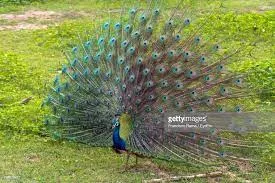

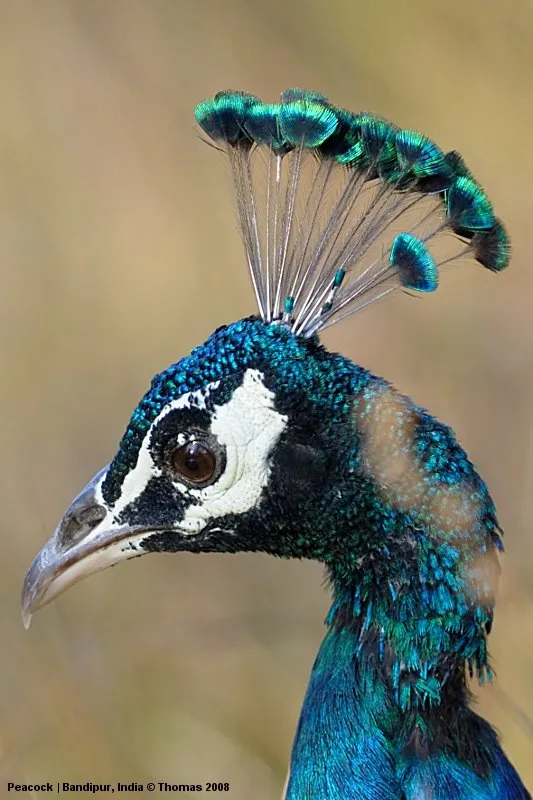

Inception network architecture makes it possible to use filters of multiple sizes without increasing the depth of the network. The different filters are added parallelly instead of being fully connected one after the other.
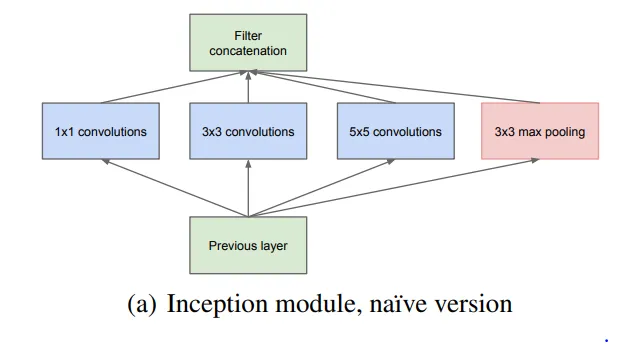
This is known as the naive version of the inception model. The problem with this model was the huge number of parameters. To mitigate the same, they came up with the below architecture.
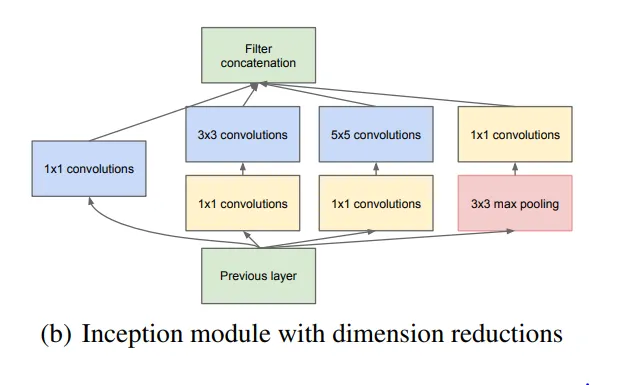

# To calucalute the number of parameters

## FOR CNN
    channels_in * kernel_width * kernel_height * channels_out + num_channels
    
    Number of Parameters=(filter height×filter width×number of input channels×number of output channels)+number of output channels
    

## FC

    Number of Parameters=(number of input units×number of output units)+number of output units

How does this architecture reduce dimensionality?
Adding a 1X1 convolution before a 5X5 convolution would reduce the number of channels of the image when it is provided as an input to the 5X5 convolution, in turn reducing the number of parameters and the computational requirement.


### Below is number of operation 

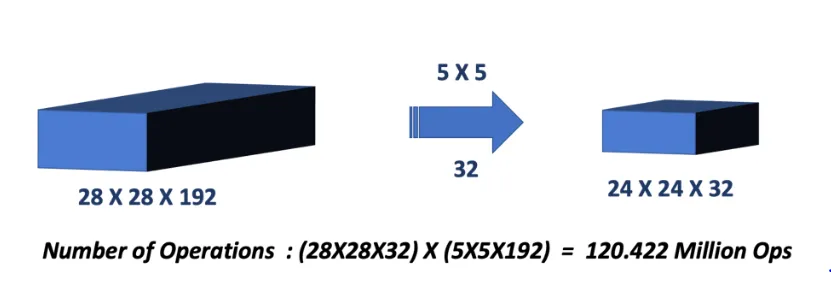

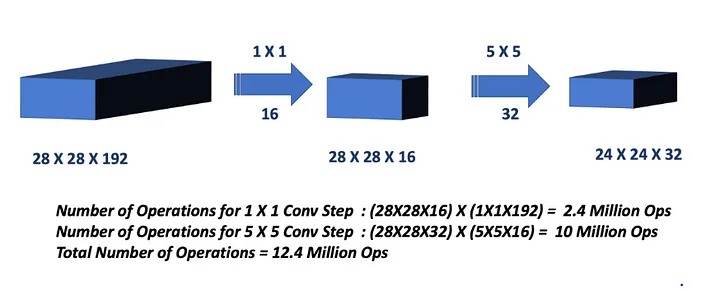


# What is different in the Inception V3 network from the inception V1 network?
Inception V3 is an extension of the V1 module, it uses techniques like factorizing larger convolutions to smaller convolutions (say a 5X5 convolution is factorized into two 3X3 convolutions) and asymmetric factorizations (example: factorizing a 3X3 filter into a 1X3 and 3X1 filter).

These factorizations are done with the aim of reducing the number of parameters being used at every inception module. Below is an image of the inception V3 module.


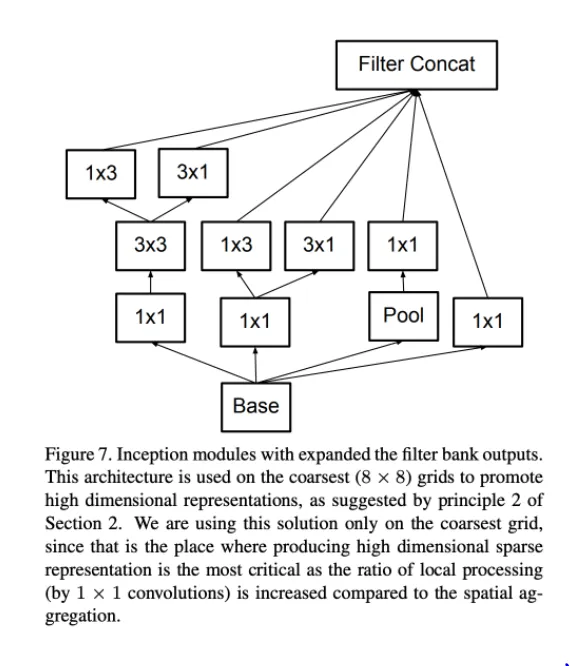



# 1X1: Comprehensive look at 1X1 Convolution in Deep Learning

Input matrix can and, in most cases, will have more than one channel. This is sometimes referred to as depth

a. Example: 64X64 pixel RGB input from an image will have 3 channels so the input is 64X64X3

2. The filter has the same depth as input except in some special cases (example 3D Convolutions to reconstruct medical images). This specific point, for some unknown reason, is not explicitly mentioned in most of the literature, causing some misunderstanding (Especially for someone new to convolutions, Deep learning etc)

a. Example: filter of 3X3 will have 3 channels as well, hence the filter should be represented as 3X3X3

3. Third and critical point, the output of Convolution step will have the depth equal to number of filters we choose.

a. Example: Output of Convolution step of the 3D input (64X64X3) and the filter we chose (3X3X3) will have the depth of 1 (Because we have only one filter)

The Convolution step on the 3D input 64X64X3 with filter size of 3X3X3 will have the filter ‘sliding’ along the width and height of the input.

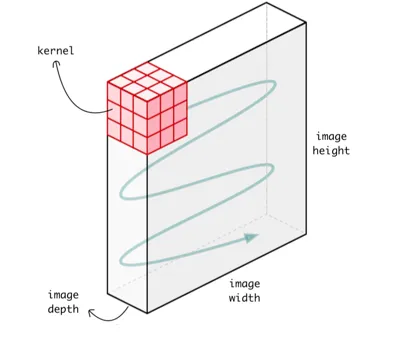

So, when we convolve the 3D filter with the 3D image, the operation moves the filter on the input in 2 directions (Along the width and height) and we do the element wise multiplication and addition at each position to end up with an output with a depth of 1.

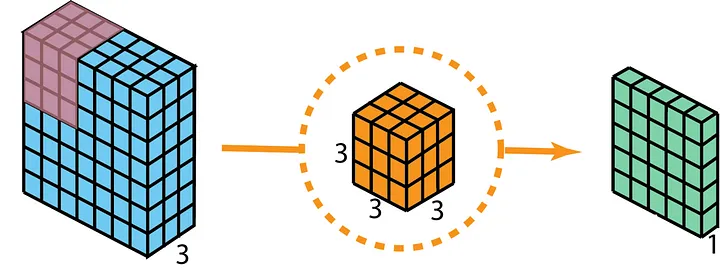


## example

import numpy as np
import torch
import torch.nn as nn

--Input tensor (5x5x3)
input_tensor = torch.randn(1, 3, 5, 5)  # (batch_size, channels, height, width)

--Filters (2 filters of 3x3x3)
filters = nn.Conv2d(in_channels=3, out_channels=2, kernel_size=3, stride=1, padding=0)

output_tensor = filters(input_tensor)

print(f"Input Tensor Shape: {input_tensor.shape}")
print(f"Output Tensor Shape: {output_tensor.shape}")

Explanation:
Input Tensor Shape:

Dimensions: 

    1×3×5×5(batch size, channels, height, width)
    Filters:

filters 
    each with dimensions 
    3×3×3
Convolution Operation:

    Apply each filter across the input tensor.
    The output tensor's dimensions depend on the padding and stride settings. For this example, with no padding and a stride of 1, the output dimensions will be reduced.



# 1X1 Convolution — What is it?

ntroduced first in a paper by Min Lin et all in their Network In Network, the 1X1 Convolution layer was used for ‘Cross Channel Down sampling’ or Cross Channel Pooling. In other words, 1X1 Conv was used to reduce the number of channels while introducing non-linearity.

In 1X1 Convolution simply means the filter is of size 1X1 (Yes — that means a single number as opposed to matrix like, say 3X3 filter). This 1X1 filter will convolve over the ENTIRE input image pixel by pixel.

Staying with our example input of 64X64X3, if we choose a 1X1 filter (which would be 1X1X3), then the output will have the same Height and Weight as input but only one channel — 64X64X1

Now consider inputs with large number of channels — 192 for example. If we want to reduce the depth and but keep the Height X Width of the feature maps (Receptive field) the same, then we can choose 1X1 filters (remember Number of filters = Output Channels) to achieve this effect. This effect of cross channel down-sampling is called ‘Dimensionality reduction’.

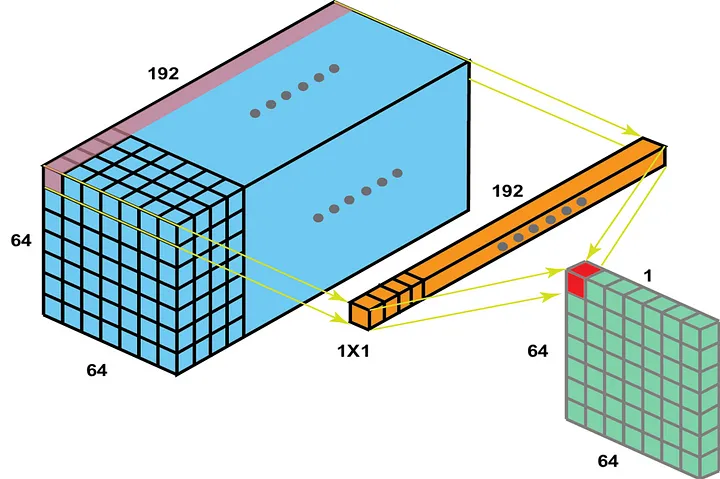

Now why would we want to something like that? For that we delve into usage of 1X1 Convolution

Usage 1: Dimensionality Reduction/Augmentation

Winner of ILSVRC (ImageNet Large Scale Visual Recognition Competition) 2014, GoogleNet, used 1X1 convolution layer for dimension reduction “to compute reductions before the expensive 3×3 and 5×5 convolutions”

Let us look at an example to understand how reducing dimension will reduce computational load. Suppose we need to convolve 28 X 28 X 192 input feature maps with 5 X 5 X 32 filters. This will result in 120.422 Million operations

By adding 1X1 Conv layer before the 5X5 Conv, while keeping the height and width of the feature map, we have reduced the number of operations by a factor of 10. This will reduce the computational needs and in turn will end up being more efficient.



# Usage 2: Building DEEPER Network (“Bottle-Neck” Layer)
2015 ILSVRC Classification winner, ResNet, had least error rate and swept aside the competition by using very deep network using ‘Residual connections’ and ‘Bottle-neck Layer’.

In their paper, He et all explains (page 6) how a bottle neck layer designed using a sequence of 3 convolutional layers with filters the size of 1X1, 3X3, followed by 1X1 respectively to reduce and restore dimension. The down-sampling of the input happens in 1X1 layer thus funneling a smaller feature vectors (reduced number of parameters) for the 3X3 conv to work on. Immediately after that 1X1 layer restores the dimensions to match input dimension so identity shortcuts can be directly used. For details on identity shortcuts and skip connection, please see some of the Reviews on ResNet (Or you can wait for my future work!)




Usage 3: Smaller yet Accurate Model (“FIRE-MODULE” Layer)
While Deep CNN Models have great accuracy, they have staggering number of parameters to deal with which increases the training time and most importantly need enterprise level computing power. Iandola et all proposed a CNN Model called SqueezeNet that retains AlexNet level accuracy while 50X times smaller in terms of parameters.

Smaller models have number of advantages, especially on use-cases that require edge computing capabilities like autonomous driving. Iandola et all achieved this by stacking a bunch of “Fire Modules” which comprise of

1. Squeeze Layer which has only 1X1 Conv filters

2. This feeds an Expansion layer which has mix of 1X1 and 3X3 filters

3. The number of filters in Squeeze Layer are set to be less than number of 1X1 filters + Number of 3X3 in Expand Layer

By now it is obvious what the 1X1 Conv filters in Squeeze Layer do — they reduce the number of parameters by ‘down-sampling’ the input channels before they are fed into the Expand layer.

The Expansion Layer has mix of 1X1 and 3X3 filters. The 1X1 filters, as you know, performs cross channel pooling — Combines channels, but cannot detect spatial structures (by virtue of working on individual pixels as opposed to a patch of input like larger filters). The 3X3 Convolution detects spatial structures. By combining these 2 different sized filters, the model becomes more expressive while operating on lesser parameters. Appropriate use of padding makes the output of 1X1 and 3X3 convolutions the same size so these can be stacked.



Summary
1. Dimensionality Reduction/Augmentation

2. Reduce computational load by reducing parameter map

3. Add additional non-linearity to the network

4. Create deeper network through “Bottle-Neck” layer

5. Create smaller CNN network which retains higher degree of accuracy

